# image number to batch/file path map

In [167]:
import os
os.listdir('/Volumes/Untitled/scene_graph_batch-1/images')

['clip_10',
 'clip_101',
 'clip_102',
 'clip_105',
 'clip_109',
 'clip_114',
 'clip_115',
 'clip_125',
 'clip_126',
 'clip_127',
 'clip_128',
 'clip_130',
 'clip_134',
 'clip_137',
 'clip_139',
 'clip_14',
 'clip_141',
 'clip_143',
 'clip_144',
 'clip_145',
 'clip_147',
 'clip_150',
 'clip_151',
 'clip_155',
 'clip_158',
 'clip_16',
 'clip_165',
 'clip_166',
 'clip_169',
 'clip_170',
 'clip_171',
 'clip_176',
 'clip_18',
 'clip_181',
 'clip_187',
 'clip_188',
 'clip_191',
 'clip_20',
 'clip_203',
 'clip_209',
 'clip_21',
 'clip_216',
 'clip_217',
 'clip_22',
 'clip_223',
 'clip_229',
 'clip_23',
 'clip_231',
 'clip_24',
 'clip_243',
 'clip_244',
 'clip_247',
 'clip_271',
 'clip_276',
 'clip_277',
 'clip_28',
 'clip_281',
 'clip_286',
 'clip_290',
 'clip_294',
 'clip_302',
 'clip_307',
 'clip_308',
 'clip_320',
 'clip_327',
 'clip_328',
 'clip_330',
 'clip_332',
 'clip_333',
 'clip_337',
 'clip_342',
 'clip_352',
 'clip_358',
 'clip_360',
 'clip_368',
 'clip_374',
 'clip_376',
 'clip_37

In [73]:
data_dict = {}
for batch in range(1,4):
    path = f'/Volumes/Untitled/scene_graph_batch-{batch}/images'
    for clip in os.listdir(path):
        if clip not in data_dict:
            data_dict[clip] = {}
        for img_name in os.listdir(path+'/'+clip):
            img_name_no_png = img_name.split('.')[0]
            if img_name_no_png not in data_dict[clip]:
                data_dict[clip][img_name_no_png] = []
            data_dict[clip][img_name_no_png].append(batch)
            

In [ ]:
for clip in data_dict:
    for img in data_dict[clip]:
        if len(data_dict[clip][img])>0:
            print(clip,img)

In [78]:
import pickle
with open('clip_number_to_batch.pkl', 'wb') as f:
    pickle.dump(data_dict, f)

# image checking

In [176]:
# imports
import os
import numpy as np
import pandas as pd
import cv2
from urllib.request import urlopen
import pickle
import matplotlib.pyplot as plt

In [177]:
df = pd.read_csv('combined_data_remapped.csv')
sampled_df = df.sample(30,random_state=1)

In [178]:
df['expanded'] = df.apply(lambda x:'action_data_expanded' in x['Input.image_address_bounding_box'],axis=1)

In [179]:
sampled_df = df[df['expanded']==True].sample(100,random_state=1)

In [5]:
df

,Unnamed: 0,HITId,HITTypeId,Title,Description,Keywords,Reward,CreationTime,MaxAssignments,RequesterAnnotation,...,Answer.annotatedResult.inputImageProperties.width,Answer.annotatedResult.labelMappings.Stop Position.color,Answer.annotatedResult.labeledImage.pngImageData,Answer.annotations,Approve,Reject,Unnamed: 39,Input.image_address_bounding_box.1,Input.image_address_standardized,expanded
0,0,30U1YOGZHPE4TR34DWKP1NITACESDE,3NN44GVSBXGHRXGR2VRFLOV21ZDGFI,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.50,Fri Jan 24 03:10:11 PST 2025,1,BatchId:5289093;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 2,Position 6,Position 3,Position 4,Po...",NaN,NaN,NaN,https://stop-position-ranker.s3.ap-northeast-1...,clip_355/images/000594.png,True
1,1,3PMR2DOWP3JQNTM08P6O58EVJFE54D,3NN44GVSBXGHRXGR2VRFLOV21ZDGFI,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.50,Fri Jan 24 03:10:04 PST 2025,1,BatchId:5289093;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 2,Position 4,Position 1,Position 3,Po...",NaN,NaN,NaN,https://stop-position-ranker.s3.ap-northeast-1...,clip_65/images/000534.png,True
2,2,3B9J25CZ3KVUOZXQD0PEHH0BPC2SCE,3NN44GVSBXGHRXGR2VRFLOV21ZDGFI,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.50,Fri Jan 24 03:10:11 PST 2025,1,BatchId:5289093;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 2,Position 6,Position 3,Position 4,Po...",NaN,NaN,NaN,https://stop-position-ranker.s3.ap-northeast-1...,clip_355/images/000594.png,True
3,3,3TUOHPJXZWFBYEPUO1V2SJO6W7MXW0,3NN44GVSBXGHRXGR2VRFLOV21ZDGFI,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.50,Fri Jan 24 03:10:11 PST 2025,1,BatchId:5289093;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 1,Position 3,Position 6,Position 2,Po...",NaN,NaN,NaN,https://stop-position-ranker.s3.ap-northeast-1...,clip_355/images/000594.png,True
4,4,3HEA4ZVWWS48JCQ0MUPYA0K9JB955I,3NN44GVSBXGHRXGR2VRFLOV21ZDGFI,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.50,Fri Jan 24 03:10:04 PST 2025,1,BatchId:5289093;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 5,Position 1,Position 3,Position 6,Po...",NaN,NaN,NaN,https://stop-position-ranker.s3.ap-northeast-1...,clip_628/images/000366.png,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9501,9501,3JYPJ2TAZXQ4EJ18CLBLUIG3YVVPFT,3GSIANI2Q8VQ6QVUE8MCRX69QDGPDG,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.75,Wed Dec 25 19:43:59 PST 2024,2,BatchId:5282481;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 4,Position 2,Position 3,Position 1,Po...",NaN,NaN,NaN,NaN,clip_141/images/000594.png,False
9502,9502,3O0M2G5VDLK9OGOCBFJ5HOJX41549Q,3GSIANI2Q8VQ6QVUE8MCRX69QDGPDG,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.75,Wed Dec 25 19:44:00 PST 2024,2,BatchId:5282481;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 1,Position 5,Position 2,Position 3,Po...",NaN,NaN,NaN,NaN,clip_271/images/000492.png,False
9503,9503,3V0TR1NRWPKNTZYH3LX5DJUHAJN4A5,3GSIANI2Q8VQ6QVUE8MCRX69QDGPDG,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.75,Wed Dec 25 19:44:00 PST 2024,2,BatchId:5282481;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAA

In [ ]:
# mapping clip - position ranking - panoptic image no
position_rank_panoptic_mapper = {}
for index,row in sampled_df.iterrows():
    #get link for position ranking
    position_ranking_link = row['Input.image_address_bounding_box']
    image_address_standardized = row['Input.image_address_standardized']
    #get clip_no and position_ranking_no
    clip_no,_,position_ranking_no = image_address_standardized.split('/')
    print(position_ranking_link)
    print(clip_no)
    print(position_ranking_no)
    
    break
    #find clip number in panoptic

    resp = urlopen(image_link)
    image = np.asarray(bytearray(resp.read()), dtype="uint8")
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)

    path = f'/Volumes/Untitled/titan_data/dataset/images_anonymized/{clip_no}/images'
    found = False
    for img_name in os.listdir(path):
        img = cv2.imread(os.path.join(path,img_name))
        if np.all(img==image):
            found = True
            break
    if not found: print(f'{clip_no} equivalent image not found')
    panoptic_no = img_name.split('.')[0]
    print(panoptic_no)
    if clip_no not in position_rank_panoptic_mapper:
        position_rank_panoptic_mapper[clip_no]={}
    position_rank_panoptic_mapper[clip_no][position_ranking_no] = panoptic_no
    

https://stop-position-ranker.s3.ap-northeast-1.amazonaws.com/position_ranking_ver3/logs/clip_8/22.png
clip_8
000594.png


#### runs

In [180]:
import numpy as np
from scipy.ndimage import measurements,label
import cv2
import matplotlib.figure as mplfigure
from matplotlib.backends.backend_agg import FigureCanvasAgg
import json
from scipy import ndimage

stuff_classes=[
"Bird", # need not be considered
"Ground Animal", # need not be considered
"Curb",
"Fence",
"Guard Rail",
"Barrier",
"Wall",
"Bike Lane",
"Crosswalk - Plain",
"Curb Cut", # need not be considered
"Parking",
"Pedestrian Area",
"Rail Track",# need not be considered
"Road",
"Service Lane",# need not be considered
"Sidewalk",
"Bridge",# need not be considered
"Building",# need not be considered
"Tunnel",# need not be considered
"Person",
"Bicyclist",
"Motorcyclist",
"Other Rider",
"Lane Marking - Crosswalk",
"Lane Marking - General",
"Mountain",# need not be considered
"Sand",# need not be considered
"Sky",# need not be considered
"Snow",# need not be considered
"Terrain",# need not be considered
"Vegetation",
"Water",# need not be considered
"Banner",
"Bench",
"Bike Rack",
"Billboard",# need not be considered
"Catch Basin",# need not be considered
"CCTV Camera",# need not be considered
"Fire Hydrant",
"Junction Box",
"Mailbox",
"Manhole",
"Phone Booth",
"Pothole",
"Street Light",
"Pole",
"Traffic Sign Frame",
"Utility Pole",
"Traffic Light",
"Traffic Sign (Back)",
"Traffic Sign (Front)",
"Trash Can",
"Bicycle",
"Boat",
"Bus",
"Car",
"Caravan",
"Motorcycle",
"On Rails",# need not be considered
"Other Vehicle",
"Trailer",
"Truck",
"Wheeled Slow",# need not be considered
"Car Mount",# need not be considered
"Ego Vehicle",
"Stop Positions"
]

_COLORS = []

def gen_color():
    color = tuple(np.round(np.random.choice(range(256), size=3), 3))
    if color not in _COLORS and np.mean(color) != 0.0:
        _COLORS.append(color)
    else:
        gen_color()


for _ in range(300):
    gen_color()

def overlay(image, mask, color, alpha, resize=None):
    """Combines image and its segmentation mask into a single image.
    https://www.kaggle.com/code/purplejester/showing-samples-with-segmentation-mask-overlay

    Params:
        image: Training image. np.ndarray,
        mask: Segmentation mask. np.ndarray,
        color: Color for segmentation mask rendering.  tuple[int, int, int] = (255, 0, 0)
        alpha: Segmentation mask's transparency. float = 0.5,
        resize: If provided, both image and its mask are resized before blending them together.
        tuple[int, int] = (1024, 1024))

    Returns:
        image_combined: The combined image. np.ndarray

    """
    color = color[::-1]
    colored_mask = np.expand_dims(mask, 0).repeat(3, axis=0)
    colored_mask = np.moveaxis(colored_mask, 0, -1)
    masked = np.ma.MaskedArray(image, mask=colored_mask, fill_value=color)
    image_overlay = masked.filled()

    if resize is not None:
        image = cv2.resize(image.transpose(1, 2, 0), resize)
        image_overlay = cv2.resize(image_overlay.transpose(1, 2, 0), resize)

    image_combined = cv2.addWeighted(image, 1 - alpha, image_overlay, alpha, 0)

    return image_combined

#### continue

In [ ]:
# for index,row in sampled_df.iterrows():
#     position_ranking_link = row['Input.image_address_bounding_box']
#     image_address_standardized = row['Input.image_address_standardized']
#     clip_no,_,position_ranking_no = image_address_standardized.split('/')
#     position_ranking_no = position_ranking_no.split('.')[0]
#     print(position_ranking_link)
#     print(clip_no,position_ranking_no)
#     with open('clip_number_to_batch.pkl', 'rb') as f:
#         data_dict = pickle.load(f)
#     batch_no = data_dict[clip_no][position_ranking_no][0]
#     image_mask = np.load(f'/Volumes/Untitled/scene_graph_batch-{batch_no}/panoptic_scene_graph_batch_{batch_no}/{clip_no}/{position_ranking_no}_panoptic_updated.npy')
#     img = cv2.imread(f'/Volumes/Untitled/titan_data/dataset/images_anonymized/{image_address_standardized}')
#     image_with_masks = np.copy(img)
#     for i in range(1,np.max(image_with_masks)):
#         road_after_filter_sub = np.where(image_mask == i, 1, 0)
#         image_with_masks = overlay(image_with_masks, road_after_filter_sub, color=_COLORS[i-1], alpha=0.5)
#     with open(f'/Volumes/Untitled/scene_graph_batch-{batch_no}/panoptic_scene_graph_batch_{batch_no}/{clip_no}/{position_ranking_no}_panoptic_segments_updated.json', 'r') as f:
#         segments_info = json.load(f)

#     for segment in segments_info:
#         binary_mask = np.where(image_mask == segment["id"], 1, 0)
#         text = stuff_classes[segment["category_id"]] + "_" + str(segment["id"])
#         if np.max(binary_mask) == 0:
#             continue
#         else:
#             # draw text on the largest component
#             lw, num = measurements.label(binary_mask)
#             unique, counts = np.unique(lw, return_counts=True)
#             sorted_unique = [x for _, x in sorted(zip(counts, unique))]
#             sorted_unique_check = [[x,count] for count, x in sorted(zip(counts, unique))]
#             try:
#                 max_cluster = sorted_unique[-2]
#             except:
#                 max_cluster = sorted_unique[-1]
#             lw[lw != max_cluster] = 0 
#             x, y = ndimage.center_of_mass(lw)
#             font = cv2.FONT_HERSHEY_SIMPLEX
#             cv2.putText(image_with_masks,text,(int(y),int(x)), font, 0.5,(255,255,255),2,cv2.LINE_AA)
#     plt.imshow(image_with_masks)
#     print(position_ranking_link)
#     resp = urlopen(position_ranking_link)
#     pos_rank_image = np.asarray(bytearray(resp.read()), dtype="uint8")
#     pos_rank_image = cv2.imdecode(pos_rank_image, cv2.IMREAD_COLOR)
#     plt.imshow(cv2.cvtColor(pos_rank_image, cv2.COLOR_BGR2RGB))


In [88]:
i=50
7298 in sampled_df[i:i+10].index

True

In [145]:
i=0
sampled_df[i:i+10]

,Unnamed: 0,HITId,HITTypeId,Title,Description,Keywords,Reward,CreationTime,MaxAssignments,RequesterAnnotation,...,Answer.annotatedResult.inputImageProperties.width,Answer.annotatedResult.labelMappings.Stop Position.color,Answer.annotatedResult.labeledImage.pngImageData,Answer.annotations,Approve,Reject,Unnamed: 39,Input.image_address_bounding_box.1,Input.image_address_standardized,expanded
8046,8046,30IRMPJWEE106I91QO67FQ8N79ZRKO,3GSIANI2Q8VQ6QVUE8MCRX69QDGPDG,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.75,Wed Dec 25 19:42:34 PST 2024,2,BatchId:5282481;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 2,Position 4,Position 5,Position 1,Po...",NaN,NaN,NaN,NaN,clip_181/images/000252.png,False
8310,8310,3N3WJQXEM78UM4AYWY37TIDUKHP2LO,3GSIANI2Q8VQ6QVUE8MCRX69QDGPDG,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.75,Wed Dec 25 19:42:50 PST 2024,2,BatchId:5282481;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 1,Position 3,Position 2,Position 4,Po...",NaN,NaN,NaN,NaN,clip_517/images/000318.png,False
7997,7997,3EGKVCRQGBA8AGHTY6L8OJIUN25YBD,3GSIANI2Q8VQ6QVUE8MCRX69QDGPDG,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.75,Wed Dec 25 19:43:04 PST 2024,2,BatchId:5282481;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 2,Position 3,Position 4,Position 5,Po...",NaN,NaN,NaN,NaN,clip_555/images/000588.png,False
8711,8711,3VW0145YMDUEYIQR3VAESCE0MX0MJW,3GSIANI2Q8VQ6QVUE8MCRX69QDGPDG,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.75,Wed Dec 25 19:42:37 PST 2024,2,BatchId:5282481;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 5,Position 3,Position 1,Position 2,Po...",NaN,NaN,NaN,NaN,clip_277/images/000594.png,False
9014,9014,3BFNCI9LZZ8KS1HFW4G2TN0LVBK73V,3GSIANI2Q8VQ6QVUE8MCRX69QDGPDG,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.75,Wed Dec 25 19:42:55 PST 2024,2,BatchId:5282481;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 3,Position 2,Position 4,Position 1,Po...",NaN,NaN,NaN,NaN,clip_746/images/000594.png,False
9329,9329,3DQYSJDTZ0THHE33311W6DH6OTPEXO,3GSIANI2Q8VQ6QVUE8MCRX69QDGPDG,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.75,Wed Dec 25 19:43:42 PST 2024,2,BatchId:5282481;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 1,Position 3,Position 2,Position 4,Po...",NaN,NaN,NaN,NaN,clip_731/images/000348.png,False
7887,7887,3OND0WXMIBXKVO3OYXJA3RTC035EHU,3GSIANI2Q8VQ6QVUE8MCRX69QDGPDG,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.75,Wed Dec 25 19:42:21 PST 2024,2,BatchId:5282481;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 1,Position 2,Position 5,Position 3,Po...",NaN,NaN,NaN,NaN,clip_337/images/000594.png,False
9211,9211,3TTPFEFXD82GI9A9SF0CR31ZJ5IH6D,3GSIANI2Q8VQ6QVUE8MCRX69QDGPDG,Rank the stop positions on the image,Please look at a video imagining you are a tax...,"image, labeling",$0.75,Wed Dec 25 19:43:32 PST 2024,2,BatchId:5282481;OriginalHitTemplateId:928390838;,...,2704,#2ca02c,iVBORw0KGgoAAAANSUhEUgAACpAAAAXwAQMAAABl6wiCAA...,"Position 2,Position 1,Position 3,Position 5,Po...",NaN,NaN,NaN,NaN,clip_330/images/000306.png,False
8748,8748,372AGES0JJN6QI88P7LW5KGP3IERXD,3GSIANI2Q8VQ6QVUE8MCRX69QDGPDG,Rank the stop positions on the image,Please look at a video imagining you are a tax...,

In [181]:
gen = sampled_df.iterrows()

clip_200 000540
https://stop-position-ranker.s3.ap-northeast-1.amazonaws.com/action_data_expanded/visualized_stop_position/clip_200/6.png


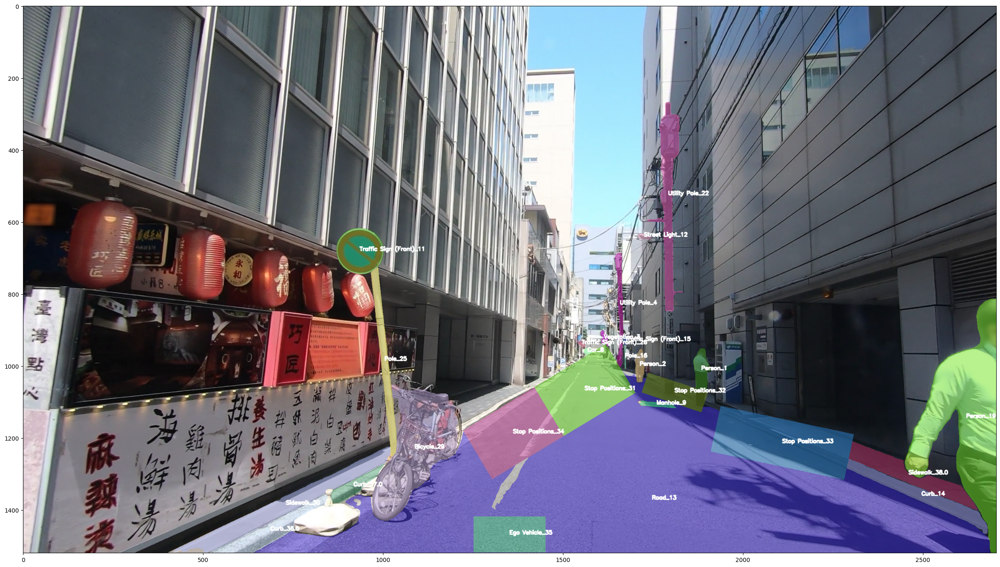

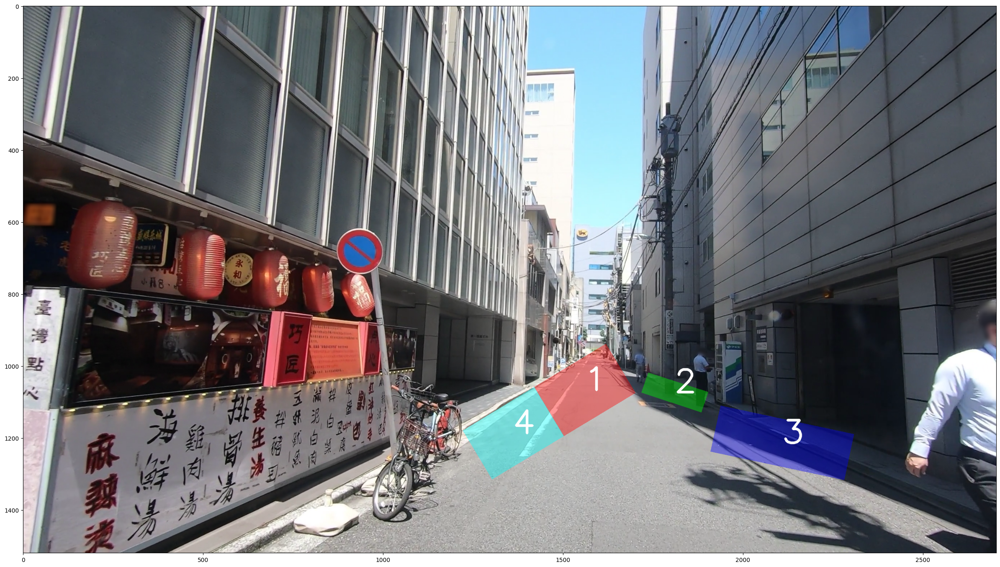

In [188]:
index,row = next(gen) 
position_ranking_link = row['Input.image_address_bounding_box']
image_address_standardized = row['Input.image_address_standardized']
clip_no,_,position_ranking_no = image_address_standardized.split('/')
position_ranking_no = position_ranking_no.split('.')[0]
print(clip_no,position_ranking_no)
print(position_ranking_link)
with open('clip_number_to_batch.pkl', 'rb') as f:
    data_dict = pickle.load(f)
batch_no = data_dict[clip_no][position_ranking_no][0]

if f'{clip_no}_{position_ranking_no}.png' in os.listdir('visualize_cache/'):
    image_with_masks = cv2.imread(f'visualize_cache/{clip_no}_{position_ranking_no}.png')
else:
    image_mask = np.load(f'/Volumes/Untitled/scene_graph_batch-{batch_no}/panoptic_scene_graph_batch_{batch_no}/{clip_no}/{position_ranking_no}_panoptic_updated.npy')
    img = cv2.imread(f'/Volumes/Untitled/titan_data/dataset/images_anonymized/{image_address_standardized}')
    image_with_masks = np.copy(img)
    for i in range(1,np.max(image_with_masks)):
        road_after_filter_sub = np.where(image_mask == i, 1, 0)
        image_with_masks = overlay(image_with_masks, road_after_filter_sub, color=_COLORS[i-1], alpha=0.5)
    with open(f'/Volumes/Untitled/scene_graph_batch-{batch_no}/panoptic_scene_graph_batch_{batch_no}/{clip_no}/{position_ranking_no}_panoptic_segments_updated.json', 'r') as f:
        segments_info = json.load(f)

    for segment in segments_info:
        binary_mask = np.where(image_mask == segment["id"], 1, 0)
        text = stuff_classes[segment["category_id"]] + "_" + str(segment["id"])
        if np.max(binary_mask) == 0:
            continue
        else:
            # draw text on the largest component
            lw, num = measurements.label(binary_mask)
            unique, counts = np.unique(lw, return_counts=True)
            sorted_unique = [x for _, x in sorted(zip(counts, unique))]
            sorted_unique_check = [[x,count] for count, x in sorted(zip(counts, unique))]
            try:
                max_cluster = sorted_unique[-2]
            except:
                max_cluster = sorted_unique[-1]
            lw[lw != max_cluster] = 0 
            x, y = ndimage.center_of_mass(lw)
            font = cv2.FONT_HERSHEY_SIMPLEX
            cv2.putText(image_with_masks,text,(int(y),int(x)), font, 0.5,(255,255,255),2,cv2.LINE_AA)
    cv2.imwrite(f'visualize_cache/{clip_no}_{position_ranking_no}.png', image_with_masks)
plt.figure(figsize=(30,54))
plt.imshow(cv2.cvtColor(image_with_masks, cv2.COLOR_BGR2RGB))
plt.show()
# print(position_ranking_link)
resp = urlopen(position_ranking_link)
pos_rank_image = np.asarray(bytearray(resp.read()), dtype="uint8")
pos_rank_image = cv2.imdecode(pos_rank_image, cv2.IMREAD_COLOR)
plt.figure(figsize=(30,54))
plt.imshow(cv2.cvtColor(pos_rank_image, cv2.COLOR_BGR2RGB))
plt.show()

In [11]:
for index,row in sampled_df.iterrows():
    position_ranking_link = row['Input.image_address_bounding_box']
    image_address_standardized = row['Input.image_address_standardized']
    clip_no,_,position_ranking_no = image_address_standardized.split('/')
    position_ranking_no = position_ranking_no.split('.')[0]
    print(clip_no,position_ranking_no)
    print(position_ranking_link)
    with open('clip_number_to_batch.pkl', 'rb') as f:
        data_dict = pickle.load(f)
    batch_no = data_dict[clip_no][position_ranking_no][0]

    if f'{clip_no}_{position_ranking_no}.png' in os.listdir('visualize_cache/'):
        image_with_masks = cv2.imread(f'visualize_cache/{clip_no}_{position_ranking_no}.png')
    else:
        image_mask = np.load(f'/Volumes/Untitled/scene_graph_batch-{batch_no}/panoptic_scene_graph_batch_{batch_no}/{clip_no}/{position_ranking_no}_panoptic_updated.npy')
        img = cv2.imread(f'/Volumes/Untitled/titan_data/dataset/images_anonymized/{image_address_standardized}')
        image_with_masks = np.copy(img)
        for i in range(1,np.max(image_with_masks)):
            road_after_filter_sub = np.where(image_mask == i, 1, 0)
            image_with_masks = overlay(image_with_masks, road_after_filter_sub, color=_COLORS[i-1], alpha=0.5)
        with open(f'/Volumes/Untitled/scene_graph_batch-{batch_no}/panoptic_scene_graph_batch_{batch_no}/{clip_no}/{position_ranking_no}_panoptic_segments_updated.json', 'r') as f:
            segments_info = json.load(f)

        for segment in segments_info:
            binary_mask = np.where(image_mask == segment["id"], 1, 0)
            text = stuff_classes[segment["category_id"]] + "_" + str(segment["id"])
            if np.max(binary_mask) == 0:
                continue
            else:
                # draw text on the largest component
                lw, num = measurements.label(binary_mask)
                unique, counts = np.unique(lw, return_counts=True)
                sorted_unique = [x for _, x in sorted(zip(counts, unique))]
                sorted_unique_check = [[x,count] for count, x in sorted(zip(counts, unique))]
                try:
                    max_cluster = sorted_unique[-2]
                except:
                    max_cluster = sorted_unique[-1]
                lw[lw != max_cluster] = 0 
                x, y = ndimage.center_of_mass(lw)
                font = cv2.FONT_HERSHEY_SIMPLEX
                cv2.putText(image_with_masks,text,(int(y),int(x)), font, 0.5,(255,255,255),2,cv2.LINE_AA)
        cv2.imwrite(f'visualize_cache/{clip_no}_{position_ranking_no}.png', image_with_masks)
    # plt.figure(figsize=(30,54))
    # plt.imshow(cv2.cvtColor(image_with_masks, cv2.COLOR_BGR2RGB))
    # plt.show()
    # # print(position_ranking_link)
    # resp = urlopen(position_ranking_link)
    # pos_rank_image = np.asarray(bytearray(resp.read()), dtype="uint8")
    # pos_rank_image = cv2.imdecode(pos_rank_image, cv2.IMREAD_COLOR)
    # plt.figure(figsize=(30,54))
    # plt.imshow(cv2.cvtColor(pos_rank_image, cv2.COLOR_BGR2RGB))
    # plt.show()

clip_181 000252
https://stop-position-ranker.s3.ap-northeast-1.amazonaws.com/position_ranking_ver3/logs/clip_181/2.png


/var/folders/0r/725ws23d3js51bfjd4f10tv40000gn/T/ipykernel_943/738964417.py:31: DeprecationWarning: Please import `label` from the `scipy.ndimage` namespace; the `scipy.ndimage.measurements` namespace is deprecated and will be removed in SciPy 2.0.0.
  lw, num = measurements.label(binary_mask)


clip_517 000318
https://stop-position-ranker.s3.ap-northeast-1.amazonaws.com/position_ranking_ver3/logs/clip_517/5.png
clip_555 000588
https://stop-position-ranker.s3.ap-northeast-1.amazonaws.com/position_ranking_ver3/logs/clip_555/5.png
clip_277 000594
https://stop-position-ranker.s3.ap-northeast-1.amazonaws.com/position_ranking_ver3/logs/clip_277/0.png
clip_746 000594
https://stop-position-ranker.s3.ap-northeast-1.amazonaws.com/position_ranking_ver3/logs/clip_746/7.png
clip_731 000348
https://stop-position-ranker.s3.ap-northeast-1.amazonaws.com/position_ranking_ver3/logs/clip_731/19.png
clip_337 000594
https://stop-position-ranker.s3.ap-northeast-1.amazonaws.com/position_ranking_ver3/logs/clip_337/6.png
clip_330 000306
https://stop-position-ranker.s3.ap-northeast-1.amazonaws.com/position_ranking_ver3/logs/clip_330/2.png
clip_330 000306
https://stop-position-ranker.s3.ap-northeast-1.amazonaws.com/position_ranking_ver3/logs/clip_330/2.png
clip_761 000594
https://stop-position-ranker.s3

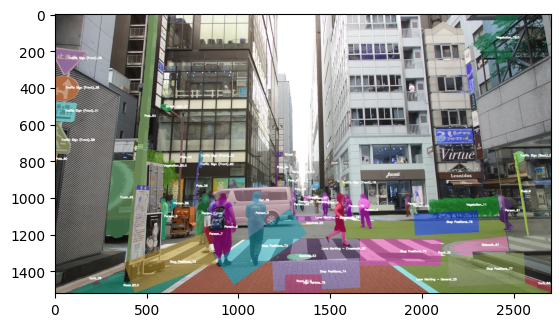

In [63]:
plt.imshow(image_with_masks)


Button(description='continue', style=ButtonStyle())

Output()

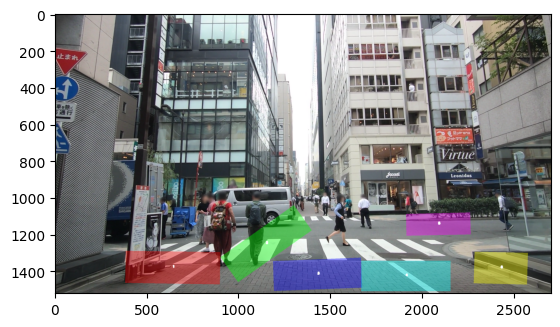

In [ ]:
import ipywidgets as widgets
from IPython.display import display
output = widgets.Output()
gen = sampled_df.iterrows()

@output.capture(clear_output=False,wait=True) # based on https://github.com/jupyter-widgets/ipywidgets/issues/1846 and https://ipywidgets.readthedocs.io/en/latest/examples/Output%20Widget.html
def next_image(b):
    global gen
    index,row = next(gen)
    position_ranking_link = row['Input.image_address_bounding_box']
    image_address_standardized = row['Input.image_address_standardized']
    clip_no,_,position_ranking_no = image_address_standardized.split('/')
    position_ranking_no = position_ranking_no.split('.')[0]
    print(clip_no,position_ranking_no)
    with open('clip_number_to_batch.pkl', 'rb') as f:
        data_dict = pickle.load(f)
    batch_no = data_dict[clip_no][position_ranking_no]
    image_mask = np.load(f'/Volumes/Untitled/scene_graph_batch-{batch_no}/panoptic_scene_graph_batch_{batch_no}/{clip_no}/{position_ranking_no}_panoptic_updated.npy')
    img = cv2.imread(f'/Volumes/Untitled/titan_data/dataset/images_anonymized/{image_address_standardized}')
    image_with_masks = np.copy(img)
    for i in range(1,np.max(image_with_masks)):
        road_after_filter_sub = np.where(image_mask == i, 1, 0)
        image_with_masks = overlay(image_with_masks, road_after_filter_sub, color=_COLORS[i-1], alpha=0.5)
    with open(f'/Volumes/Untitled/scene_graph_batch-{batch_no}/panoptic_scene_graph_batch_{batch_no}/{clip_no}/{position_ranking_no}_panoptic_segments_updated.json', 'r') as f:
        segments_info = json.load(f)

    for segment in segments_info:
        binary_mask = np.where(image_mask == segment["id"], 1, 0)
        text = stuff_classes[segment["category_id"]] + "_" + str(segment["id"])
        if np.max(binary_mask) == 0:
            continue
        else:
            # draw text on the largest component
            lw, num = measurements.label(binary_mask)
            unique, counts = np.unique(lw, return_counts=True)
            sorted_unique = [x for _, x in sorted(zip(counts, unique))]
            sorted_unique_check = [[x,count] for count, x in sorted(zip(counts, unique))]
            try:
                max_cluster = sorted_unique[-2]
            except:
                max_cluster = sorted_unique[-1]
            lw[lw != max_cluster] = 0 
            x, y = ndimage.center_of_mass(lw)
            font = cv2.FONT_HERSHEY_SIMPLEX
            cv2.putText(image_with_masks,text,(int(y),int(x)), font, 0.5,(255,255,255),2,cv2.LINE_AA)
    plt.imshow(image_with_masks)
    print(position_ranking_link)
    resp = urlopen(position_ranking_link)
    pos_rank_image = np.asarray(bytearray(resp.read()), dtype="uint8")
    pos_rank_image = cv2.imdecode(pos_rank_image, cv2.IMREAD_COLOR)
    plt.imshow(cv2.cvtColor(pos_rank_image, cv2.COLOR_BGR2RGB))
    print('done')
run_button = widgets.Button(
      description = 'continue'
)
run_button.on_click(next_image)
display(run_button)
output

In [56]:
import ipywidgets as widgets
from IPython.display import display
output = widgets.Output()

@output.capture(clear_output=False,wait=True) # based on https://github.com/jupyter-widgets/ipywidgets/issues/1846 and https://ipywidgets.readthedocs.io/en/latest/examples/Output%20Widget.html
def sayHello(b):
    print("You have pushed the button, congratulations I guess.")

run_button = widgets.Button(
      description = 'continue'
)
print("Hello, please push the continue button")
run_button.on_click(sayHello)
display(run_button)
output

Hello, please push the continue button


Button(description='continue', style=ButtonStyle())

Output()

a


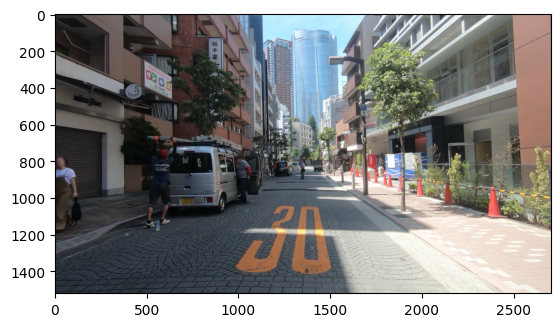

In [59]:
img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(img)
print('a')

In [ ]:
os.listdir()

['000006.png',
 '000012.png',
 '000018.png',
 '000024.png',
 '000030.png',
 '000036.png',
 '000042.png',
 '000048.png',
 '000054.png',
 '000060.png',
 '000066.png',
 '000072.png',
 '000078.png',
 '000084.png',
 '000090.png',
 '000096.png',
 '000102.png',
 '000108.png',
 '000114.png',
 '000120.png',
 '000126.png',
 '000132.png',
 '000138.png',
 '000144.png',
 '000150.png',
 '000156.png',
 '000162.png',
 '000168.png',
 '000174.png',
 '000180.png',
 '000186.png',
 '000192.png',
 '000198.png',
 '000204.png',
 '000210.png',
 '000216.png',
 '000222.png',
 '000228.png',
 '000234.png',
 '000240.png',
 '000246.png',
 '000252.png',
 '000258.png',
 '000264.png',
 '000270.png',
 '000276.png',
 '000282.png',
 '000288.png',
 '000294.png',
 '000300.png',
 '000306.png',
 '000312.png',
 '000318.png',
 '000324.png',
 '000330.png',
 '000336.png',
 '000342.png',
 '000348.png',
 '000354.png',
 '000360.png',
 '000366.png',
 '000372.png',
 '000378.png',
 '000384.png',
 '000390.png',
 '000396.png',
 '000402.p